In [1]:
# Import Necessary Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 300

In [2]:
# Load Dataset

df = pd.read_csv("D:\ExcelR\Data Science\Assignments\Decission Trees\Company_Data.csv")
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


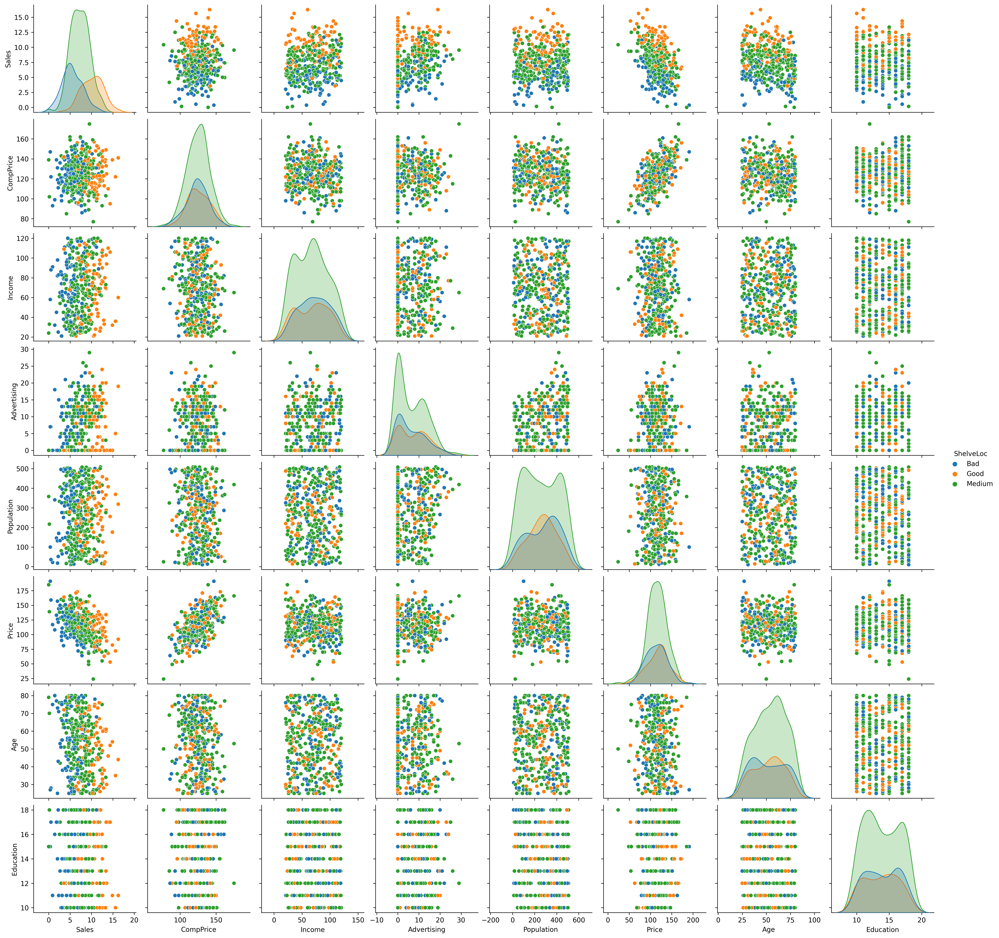

In [3]:
# plot pairplot to visualize the attribute

sns.pairplot(data=df, hue='ShelveLoc')

In [4]:
df['ShelveLoc'] = df['ShelveLoc'].map({'Good':'1','Medium':'2','Bad':'3'})
df['Urban'] = df['Urban'].map({'Yes':'1', 'No':'0'})
df['US'] = df['US'].map({'Yes':'1', 'No':'0'})
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,3,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,3,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,1,33,14,1,1
396,6.14,139,23,3,37,120,2,55,11,0,1
397,7.41,162,26,12,368,159,2,40,18,1,1
398,5.94,100,79,7,284,95,3,50,12,1,1


In [5]:
threshold = 12

# Creating a binary target variable 'HighSales' based on the threshold
df['HighSales'] = (df['Sales'] > threshold).astype(int)
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,HighSales
0,9.50,138,73,11,276,120,3,42,17,1,1,0
1,11.22,111,48,16,260,83,1,65,10,1,1,0
2,10.06,113,35,10,269,80,2,59,12,1,1,0
3,7.40,117,100,4,466,97,2,55,14,1,1,0
4,4.15,141,64,3,340,128,3,38,13,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,1,33,14,1,1,1
396,6.14,139,23,3,37,120,2,55,11,0,1,0
397,7.41,162,26,12,368,159,2,40,18,1,1,0
398,5.94,100,79,7,284,95,3,50,12,1,1,0


In [6]:
# Defining Dependent & Independent Variables

x = df.iloc[:,1:11]
y = df['HighSales']

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size=0.2, random_state=42)

In [8]:
# Decision Tree using "gini" criterion

dtc = DecisionTreeClassifier(splitter='random', max_depth=3)
dtc.fit(xtrain, ytrain)
dtc_pred = dtc.predict(xtest)

from sklearn.metrics import classification_report

print(f"Training Accuracy :", dtc.score(xtrain, ytrain))
print(f"Testing Accuracy :", dtc.score(xtest, ytest))
print(f"Model Accuracy :", classification_report(ytest, dtc_pred))

Training Accuracy : 0.95625
Testing Accuracy : 0.85
Model Accuracy :               precision    recall  f1-score   support

           0       0.86      0.99      0.92        69
           1       0.00      0.00      0.00        11

    accuracy                           0.85        80
   macro avg       0.43      0.49      0.46        80
weighted avg       0.74      0.85      0.79        80



In [9]:
x.columns

Index(['CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'ShelveLoc', 'Age', 'Education', 'Urban', 'US'],
      dtype='object')

[Text(0.4230769230769231, 0.875, 'Price <= 66.816\ngini = 0.095\nsamples = 320\nvalue = [304, 16]\nclass = 1'),
 Text(0.15384615384615385, 0.625, 'Income <= 40.39\ngini = 0.5\nsamples = 6\nvalue = [3, 3]\nclass = 1'),
 Text(0.07692307692307693, 0.375, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = 2'),
 Text(0.23076923076923078, 0.375, 'Education <= 15.369\ngini = 0.48\nsamples = 5\nvalue = [3, 2]\nclass = 1'),
 Text(0.15384615384615385, 0.125, 'gini = 0.375\nsamples = 4\nvalue = [3, 1]\nclass = 1'),
 Text(0.3076923076923077, 0.125, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = 2'),
 Text(0.6923076923076923, 0.625, 'ShelveLoc <= 1.664\ngini = 0.079\nsamples = 314\nvalue = [301, 13]\nclass = 1'),
 Text(0.5384615384615384, 0.375, 'US <= 0.249\ngini = 0.225\nsamples = 62\nvalue = [54, 8]\nclass = 1'),
 Text(0.46153846153846156, 0.125, 'gini = 0.0\nsamples = 18\nvalue = [18, 0]\nclass = 1'),
 Text(0.6153846153846154, 0.125, 'gini = 0.298\nsamples = 44\nvalue = [36, 8]\nclass = 1'),


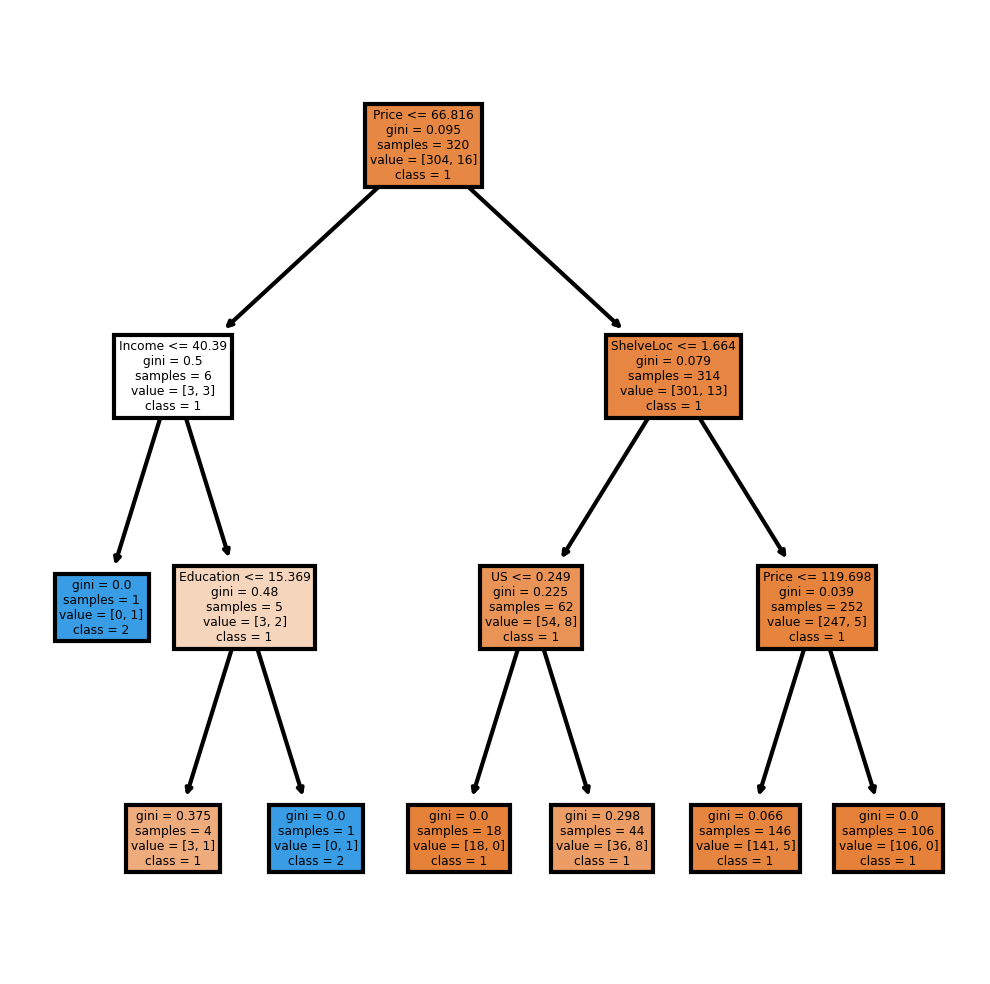

In [10]:
# Ploting "tree plot"

from sklearn import tree

fn = ['CompPrice', 'Income', 'Advertising', 'Population', 'Price', 'ShelveLoc', 'Age', 'Education', 'Urban', 'US']
cn = ['1','2','3']
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4,4), dpi=300)
tree.plot_tree(dtc,
              feature_names=fn,
              class_names=cn,
              filled=True)

In [11]:
# Decision Tree using "entropy" criterion

dtc_etrp = DecisionTreeClassifier(criterion='entropy', splitter='random', max_depth=3)
dtc_etrp.fit(xtrain, ytrain)
dtc_etrp_pred = dtc_etrp.predict(xtest)

from sklearn.metrics import classification_report

print(f"Training Accuracy :", dtc_etrp.score(xtrain, ytrain))
print(f"Testing Accuracy :", dtc_etrp.score(xtest, ytest))
print(f"Model Accuracy :", classification_report(ytest, dtc_etrp_pred))

Training Accuracy : 0.95
Testing Accuracy : 0.8625
Model Accuracy :               precision    recall  f1-score   support

           0       0.86      1.00      0.93        69
           1       0.00      0.00      0.00        11

    accuracy                           0.86        80
   macro avg       0.43      0.50      0.46        80
weighted avg       0.74      0.86      0.80        80



[Text(0.625, 0.875, 'ShelveLoc <= 2.135\nentropy = 0.286\nsamples = 320\nvalue = [304, 16]\nclass = 1'),
 Text(0.5, 0.625, 'ShelveLoc <= 1.503\nentropy = 0.35\nsamples = 243\nvalue = [227, 16]\nclass = 1'),
 Text(0.25, 0.375, 'Price <= 140.505\nentropy = 0.625\nsamples = 64\nvalue = [54, 10]\nclass = 1'),
 Text(0.125, 0.125, 'entropy = 0.699\nsamples = 53\nvalue = [43, 10]\nclass = 1'),
 Text(0.375, 0.125, 'entropy = 0.0\nsamples = 11\nvalue = [11, 0]\nclass = 1'),
 Text(0.75, 0.375, 'Education <= 15.183\nentropy = 0.212\nsamples = 179\nvalue = [173, 6]\nclass = 1'),
 Text(0.625, 0.125, 'entropy = 0.281\nsamples = 123\nvalue = [117, 6]\nclass = 1'),
 Text(0.875, 0.125, 'entropy = 0.0\nsamples = 56\nvalue = [56, 0]\nclass = 1'),
 Text(0.75, 0.625, 'entropy = 0.0\nsamples = 77\nvalue = [77, 0]\nclass = 1')]

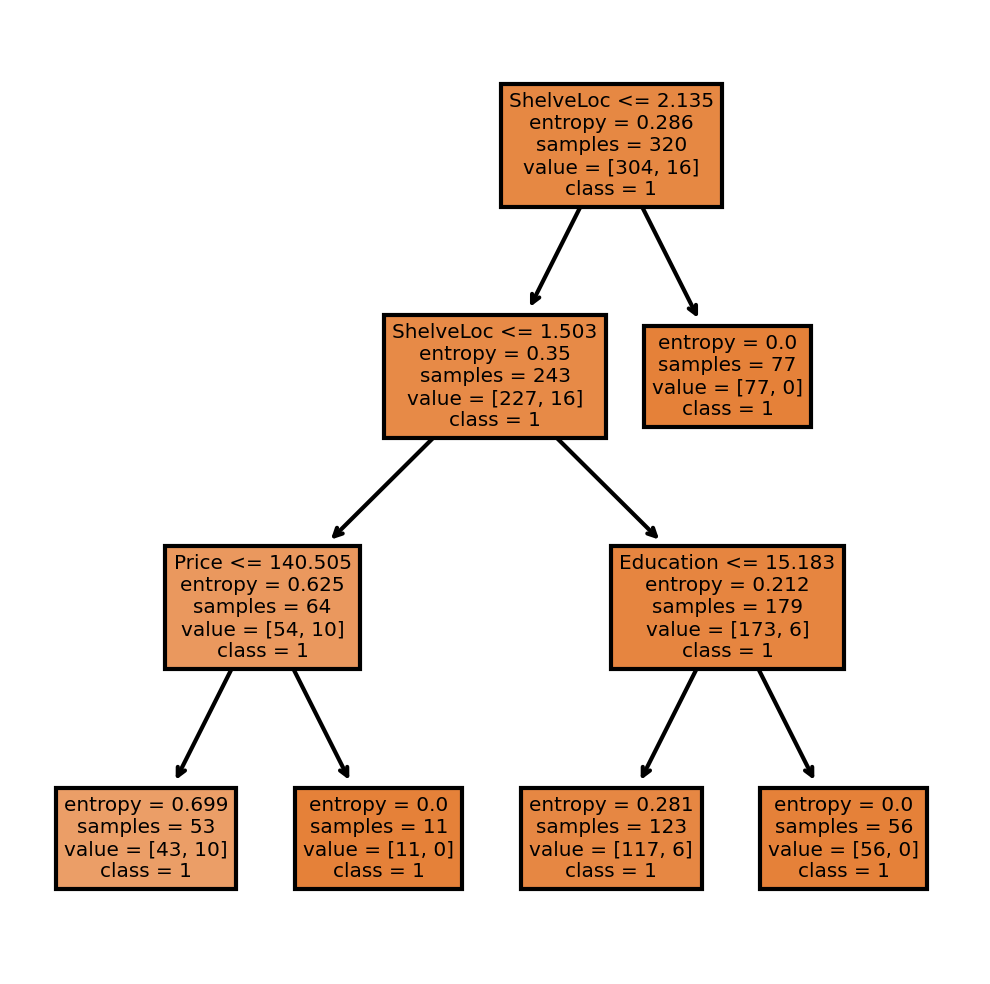

In [12]:
fig2, axes2 = plt.subplots(nrows=1, ncols=1, figsize=(4,4), dpi=300)
tree.plot_tree(dtc_etrp,
              feature_names=fn,
              class_names=cn,
              filled=True)

In [13]:
# Decision Tree using "log_loss" criterion

dtc_lgls = DecisionTreeClassifier(criterion='log_loss', splitter='random', max_depth=3)
dtc_lgls.fit(xtrain, ytrain)
dtc_lgls_pred = dtc_etrp.predict(xtest)

from sklearn.metrics import classification_report

print(f"Training Accuracy :", dtc_lgls.score(xtrain, ytrain))
print(f"Testing Accuracy :", dtc_lgls.score(xtest, ytest))
print(f"Model Accuracy :", classification_report(ytest, dtc_lgls_pred))

Training Accuracy : 0.965625
Testing Accuracy : 0.85
Model Accuracy :               precision    recall  f1-score   support

           0       0.86      1.00      0.93        69
           1       0.00      0.00      0.00        11

    accuracy                           0.86        80
   macro avg       0.43      0.50      0.46        80
weighted avg       0.74      0.86      0.80        80



[Text(0.5, 0.875, 'Price <= 74.52\nlog_loss = 0.286\nsamples = 320\nvalue = [304, 16]\nclass = 1'),
 Text(0.25, 0.625, 'ShelveLoc <= 1.448\nlog_loss = 0.971\nsamples = 15\nvalue = [9, 6]\nclass = 1'),
 Text(0.125, 0.375, 'Advertising <= 15.463\nlog_loss = 0.722\nsamples = 5\nvalue = [1, 4]\nclass = 2'),
 Text(0.0625, 0.125, 'log_loss = 0.0\nsamples = 4\nvalue = [0, 4]\nclass = 2'),
 Text(0.1875, 0.125, 'log_loss = 0.0\nsamples = 1\nvalue = [1, 0]\nclass = 1'),
 Text(0.375, 0.375, 'US <= 0.91\nlog_loss = 0.722\nsamples = 10\nvalue = [8, 2]\nclass = 1'),
 Text(0.3125, 0.125, 'log_loss = 0.0\nsamples = 7\nvalue = [7, 0]\nclass = 1'),
 Text(0.4375, 0.125, 'log_loss = 0.918\nsamples = 3\nvalue = [1, 2]\nclass = 2'),
 Text(0.75, 0.625, 'Advertising <= 14.992\nlog_loss = 0.208\nsamples = 305\nvalue = [295, 10]\nclass = 1'),
 Text(0.625, 0.375, 'Advertising <= 7.808\nlog_loss = 0.114\nsamples = 261\nvalue = [257, 4]\nclass = 1'),
 Text(0.5625, 0.125, 'log_loss = 0.051\nsamples = 174\nvalue = [

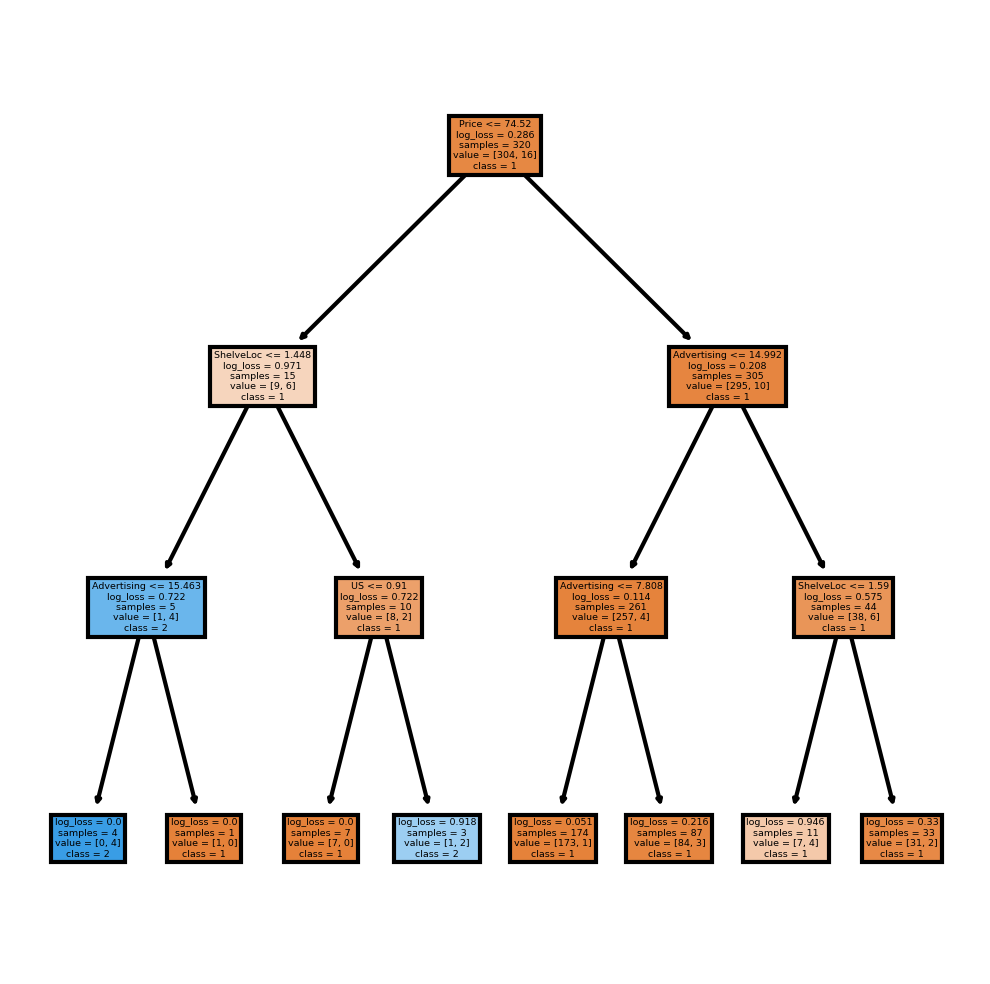

In [14]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4,4), dpi=300)
tree.plot_tree(dtc_lgls,
              feature_names=fn,
              class_names=cn,
              filled=True)